In [31]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from pathlib import Path
import seaborn as sns
from sklearn.metrics import confusion_matrix
import pynapple as nap
from spatial_manifolds.toroidal import *
from spatial_manifolds.behaviour_plots import *
from matplotlib.colors import TwoSlopeNorm
from scipy.spatial import distance
from spatial_manifolds.circular_decoder import circular_decoder, cross_validate_decoder, cross_validate_decoder_time, circular_nanmean
from spatial_manifolds.data.curation import curate_clusters
from scipy.stats import zscore
from spatial_manifolds.util import gaussian_filter_nan
from spatial_manifolds.predictive_grid import compute_travel_projected, wrap_list
from spatial_manifolds.behaviour_plots import *
from spatial_manifolds.behaviour_plots import trial_cat_priority
from spatial_manifolds.detect_grids import *

import hdbscan
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# loop over mouse and day and collect all gcs into a dictionary if there are more than 10 gcs detected
dict_t = {}
for mouse in [20,21,22,25,26,27,28,29]:
    for day in [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,26, 27]:
        try:
            print(f'Processing mouse {mouse}, day {day}')
            gcs, ngs, ns, sc, ngs_ns, all = cell_classification_of1(mouse, day, percentile_threshold=95)
            if len(gcs) > 5:
                dict_t[f'm{mouse}d{day}'] = (pd.DataFrame(gcs[['cluster_id', 'field_spacing', 'orientation']]), 
                                             pd.DataFrame(all[['cluster_id', 'field_spacing', 'orientation']]))
        except Exception as e:
            print(f'Error processing mouse {mouse}, day {day}: {e}')
            continue 
print(f'there are {len(dict_t)} mice and days with more than 10 gcs detected')   


Processing mouse 20, day 10
Error processing mouse 20, day 10: File /Users/harryclark/Downloads/COHORT12/M20/D10/VR/sub-20_day-10_ses-VR_srt-kilosort4_clusters.npz does not exist
Processing mouse 20, day 11
Error processing mouse 20, day 11: File /Users/harryclark/Downloads/COHORT12/M20/D11/VR/sub-20_day-11_ses-VR_srt-kilosort4_clusters.npz does not exist
Processing mouse 20, day 12
Error processing mouse 20, day 12: File /Users/harryclark/Downloads/COHORT12/M20/D12/VR/sub-20_day-12_ses-VR_srt-kilosort4_clusters.npz does not exist
Processing mouse 20, day 13
Error processing mouse 20, day 13: File /Users/harryclark/Downloads/COHORT12/M20/D13/VR/sub-20_day-13_ses-VR_beh.nwb does not exist
Processing mouse 20, day 14
20 14
there are 169 non_grid and non_spatial_cells
there are 0 grid_cells
there are 93 non grid spatial cells
there are 76 non spatial cells
there are 35 speed cells
there are 204 cells
Processing mouse 20, day 15
20 15
there are 61 non_grid and non_spatial_cells
there are 1

Processing m20d25 with 11 grid cells


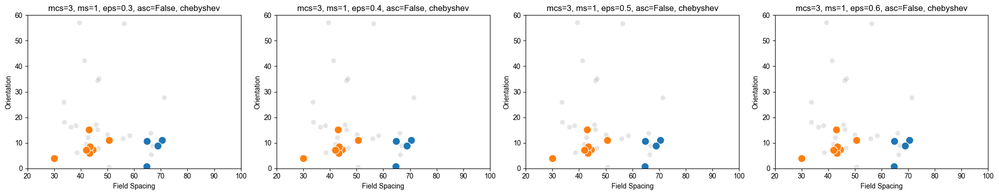

Processing m21d16 with 17 grid cells


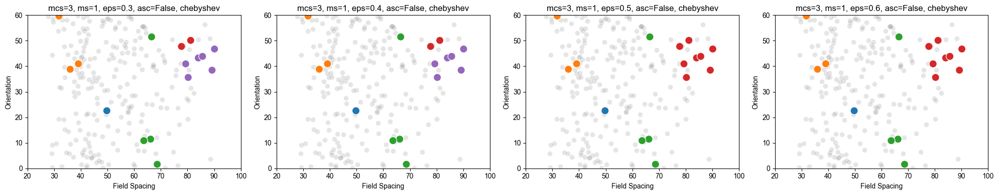

Processing m21d19 with 7 grid cells


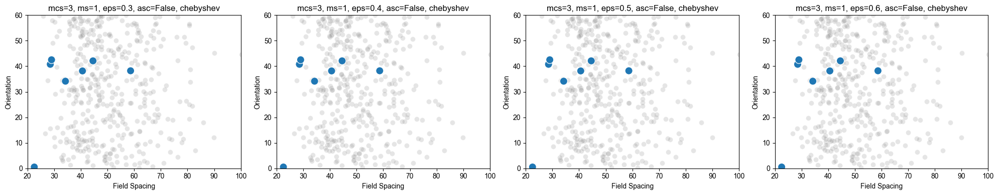

Processing m21d20 with 7 grid cells


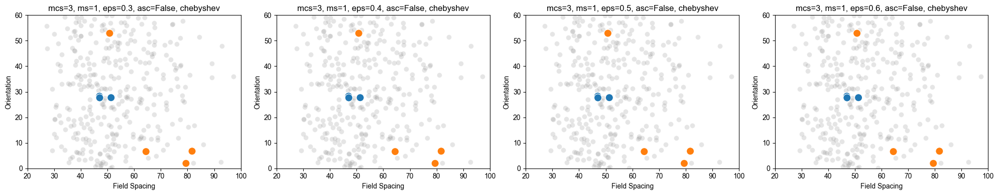

Processing m21d21 with 39 grid cells


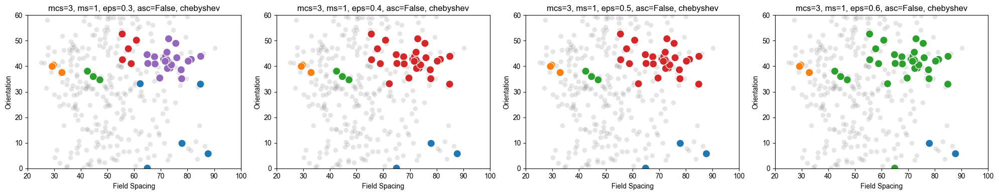

Processing m21d25 with 8 grid cells


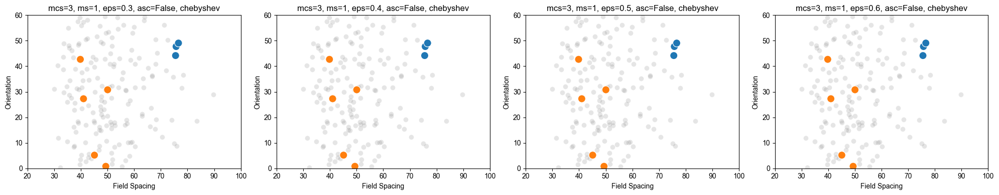

Processing m21d26 with 24 grid cells


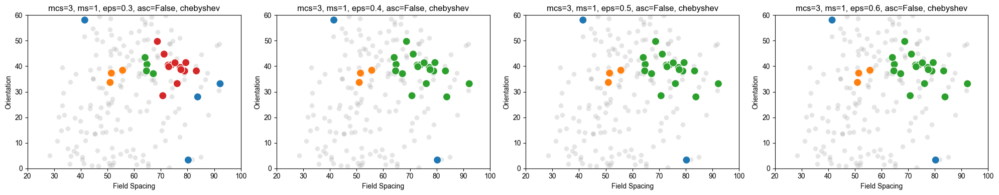

Processing m21d27 with 8 grid cells


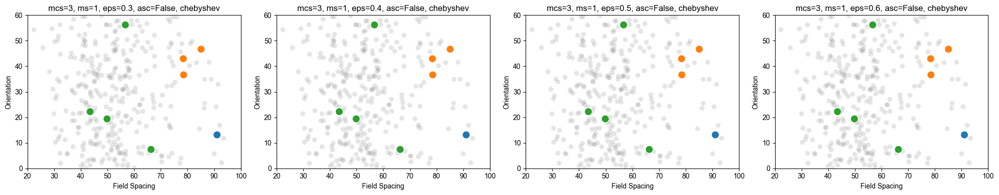

Processing m25d18 with 6 grid cells


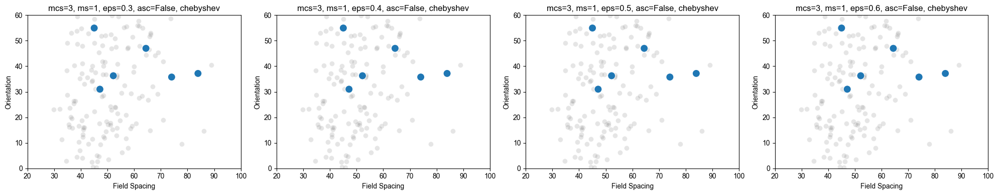

Processing m25d19 with 12 grid cells


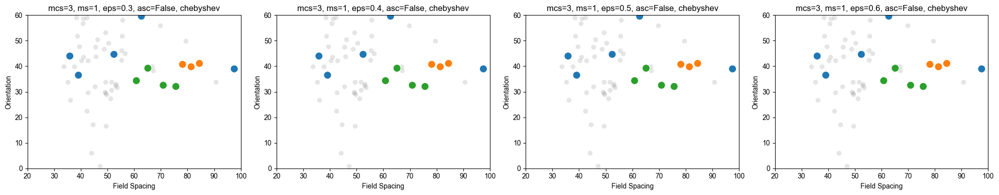

Processing m25d20 with 13 grid cells


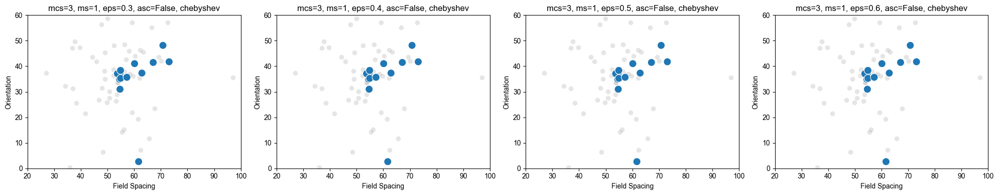

Processing m25d21 with 24 grid cells


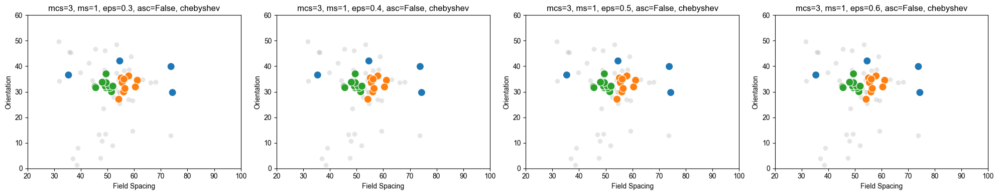

Processing m25d22 with 9 grid cells


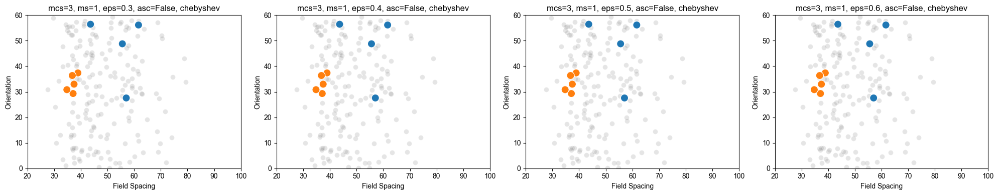

Processing m25d24 with 23 grid cells


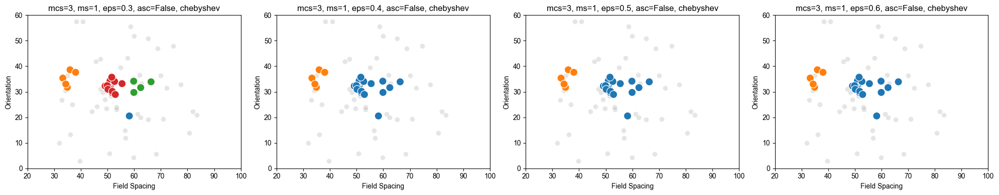

Processing m25d25 with 39 grid cells


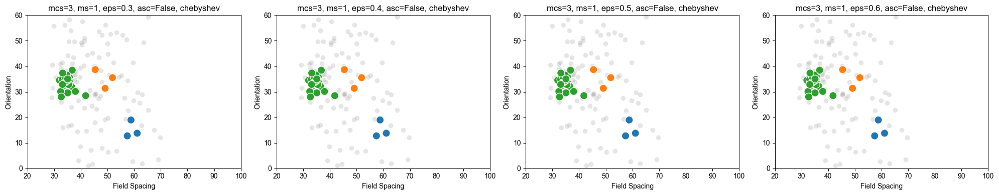

Processing m26d12 with 6 grid cells


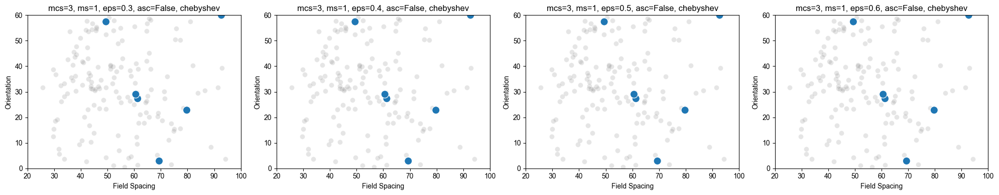

Processing m26d15 with 8 grid cells


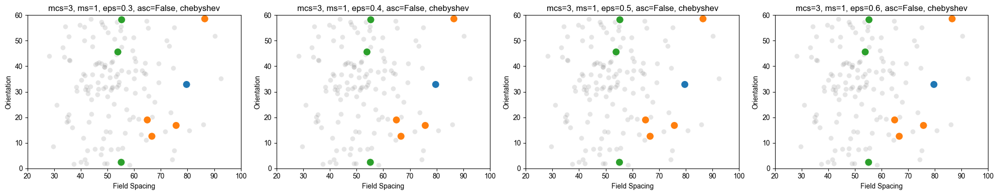

Processing m26d18 with 11 grid cells


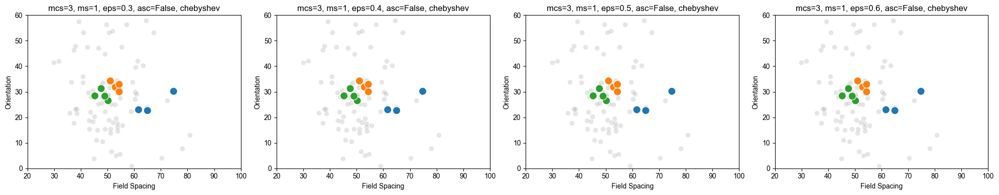

Processing m26d19 with 32 grid cells


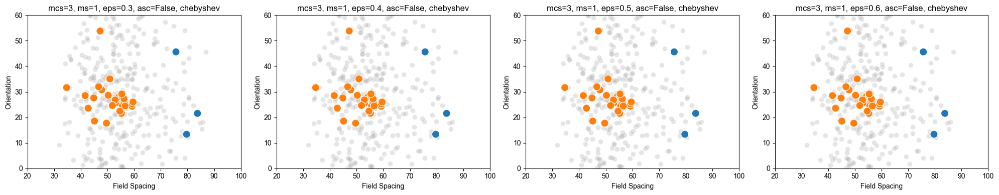

Processing m27d20 with 7 grid cells


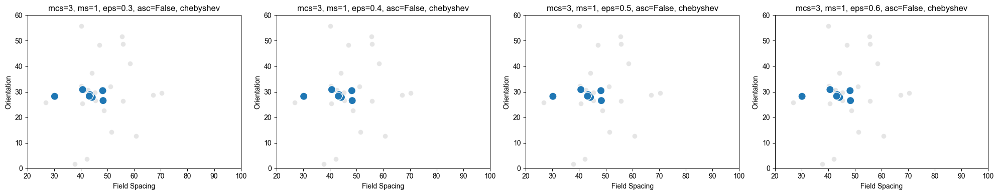

Processing m27d23 with 13 grid cells


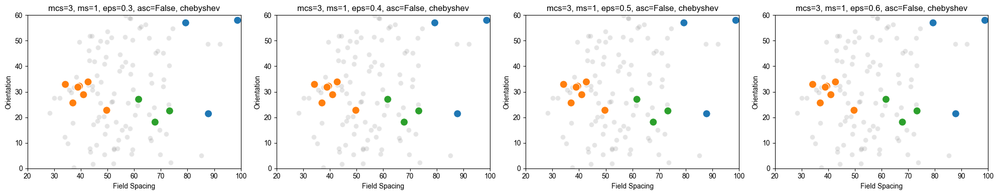

Processing m27d24 with 6 grid cells


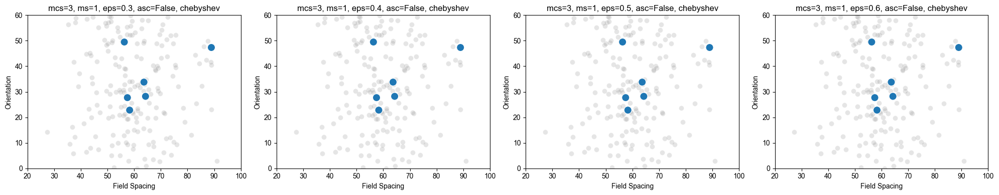

Processing m27d26 with 12 grid cells


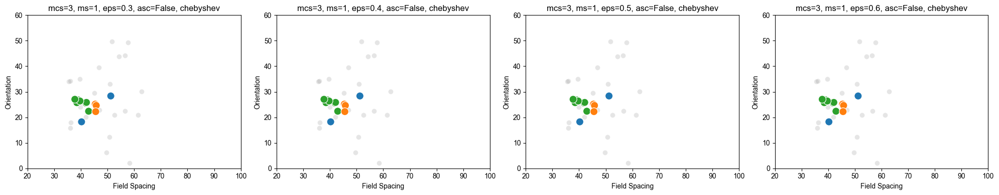

Processing m28d19 with 18 grid cells


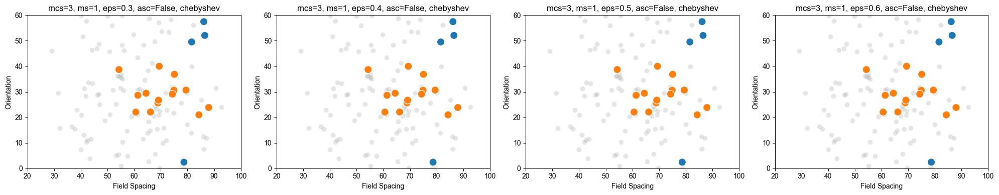

Processing m28d23 with 7 grid cells


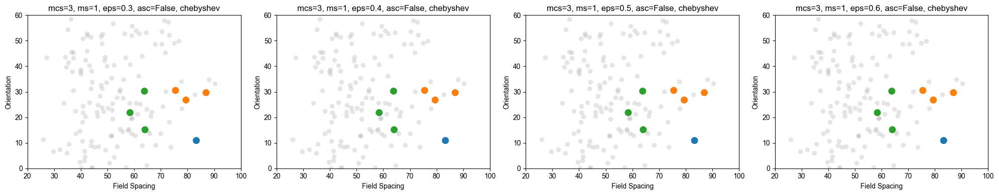

Processing m28d25 with 24 grid cells


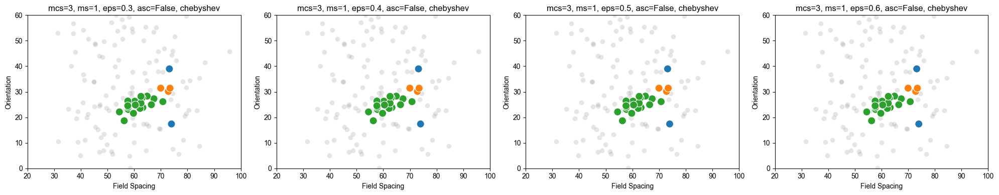

Processing m29d19 with 11 grid cells


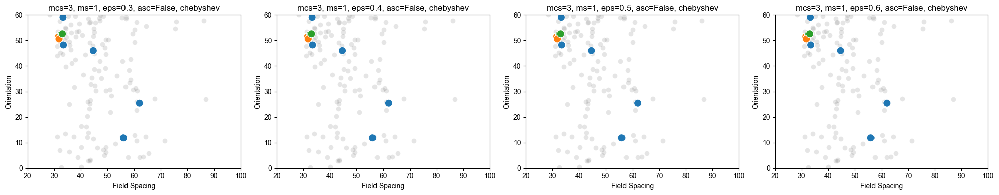

Processing m29d20 with 12 grid cells


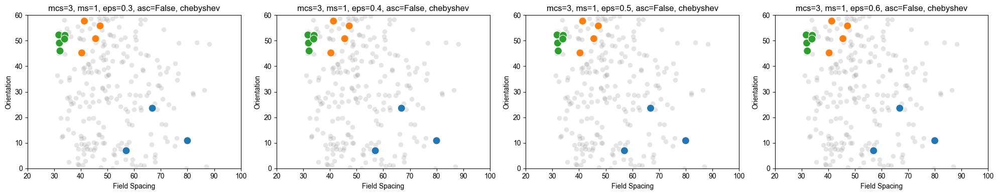

Processing m29d23 with 24 grid cells


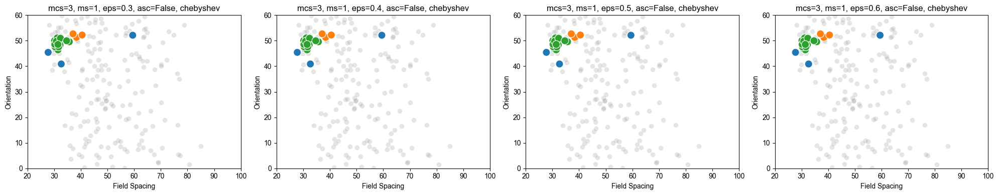

Processing m29d25 with 14 grid cells


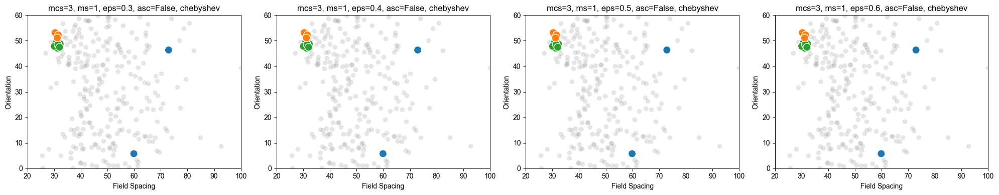

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import hdbscan

for key, (df, all_df) in dict_t.items():
    print(f'Processing {key} with {len(df)} grid cells')
    # Ensure 'field_spacing' and 'orientation' are numeric
    df['field_spacing'] = pd.to_numeric(df['field_spacing'], errors='coerce')
    df['orientation'] = pd.to_numeric(df['orientation'], errors='coerce')
    df.dropna(subset=['field_spacing', 'orientation'], inplace=True)

    all_df['field_spacing'] = pd.to_numeric(all_df['field_spacing'], errors='coerce')
    all_df['orientation'] = pd.to_numeric(all_df['orientation'], errors='coerce')
    all_df.dropna(subset=['field_spacing', 'orientation'], inplace=True)

    # Extract and preprocess features
    X = df[["cluster_id", "field_spacing", "orientation"]].copy()
    X_all = all_df[["cluster_id", "field_spacing", "orientation"]].copy()

    # Standard scale the 'field_spacing'
    scaler = StandardScaler()
    X["field_spacing_scaled"] = scaler.fit_transform(X[["field_spacing"]])

    # scale the 'field_spacing' for all clusters
    # this is to ensure that the scaling is consistent across all clusters
    # otherwise, the clusters with fewer cells will have a different scaling
    # and this will affect the clustering results
    X_all["field_spacing_scaled"] = scaler.fit_transform(X_all[["field_spacing"]])
    for i, id in enumerate(X['cluster_id']):
        X["field_spacing_scaled"].iloc[i] = X_all[X_all['cluster_id'] == id]['field_spacing_scaled'].values[0]


    # Cyclic encoding for 'orientation' (range 0 to 60)
    X["orientation_sin"] = np.sin(2 * np.pi * X["orientation"] / 60)
    X["orientation_cos"] = np.cos(2 * np.pi * X["orientation"] / 60)

    # Scale sine and cosine components to balance feature influence
    scale_factor = 1 / np.sqrt(2)
    X["orientation_sin_scaled"] = X["orientation_sin"] * scale_factor
    X["orientation_cos_scaled"] = X["orientation_cos"] * scale_factor

    # Prepare the feature matrix
    features = X[["field_spacing_scaled", "orientation_sin_scaled", "orientation_cos_scaled"]]
    original_features = X[["field_spacing", "orientation"]]
    
    # Define extended parameter grid
    min_cluster_sizes = [3]
    min_samples_list = [1]
    epsilons = [0.3, 0.4, 0.5, 0.6]
    allow_single_cluster_options = [False]
    metrics = ['chebyshev']

    # Store parameter combinations
    param_grid = []
    for mcs in min_cluster_sizes:
        for ms in min_samples_list:
            for eps in epsilons:
                for asc in allow_single_cluster_options:
                    for metric in metrics:
                        param_grid.append((mcs, ms, eps, asc, metric))

    # Display limit for subplots
    n_plots = len(param_grid)
    n_cols = 4
    n_rows = int(np.ceil(n_plots / n_cols))

    # Plot clustering results
    plt.figure(figsize=(5 * n_cols, 4 * n_rows))
    for idx, (mcs, ms, eps, asc, metric) in enumerate(param_grid, 1):
        try:
            clusterer = hdbscan.HDBSCAN(
                min_cluster_size=mcs,
                min_samples=ms,
                cluster_selection_epsilon=eps,
                allow_single_cluster=asc,
                metric=metric
            )
            labels = clusterer.fit_predict(features)
            X["cluster"] = labels

            plt.subplot(n_rows, n_cols, idx)
            sns.scatterplot(data=X_all, x="field_spacing", y="orientation", color='grey', s=50, alpha=0.2, legend=False)
            sns.scatterplot(data=X, x="field_spacing", y="orientation", hue="cluster", palette="tab10", s=120, legend=False)
            plt.title(f"mcs={mcs}, ms={ms}, eps={eps}, asc={asc}, {metric}")
            plt.xlim(20, 100)
            plt.ylim(0, 60)
            plt.xlabel("Field Spacing")
            plt.ylabel("Orientation")
        except Exception as e:
            print(f"Failed for params: mcs={mcs}, ms={ms}, eps={eps}, asc={asc}, metric={metric} with error: {e}")

    plt.tight_layout()
    plt.show()


Processing m20d25 with 11 grid cells


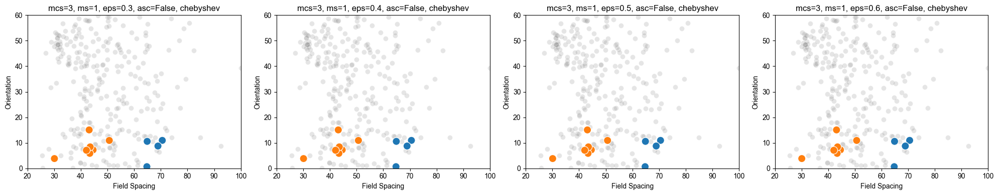

Processing m21d16 with 17 grid cells


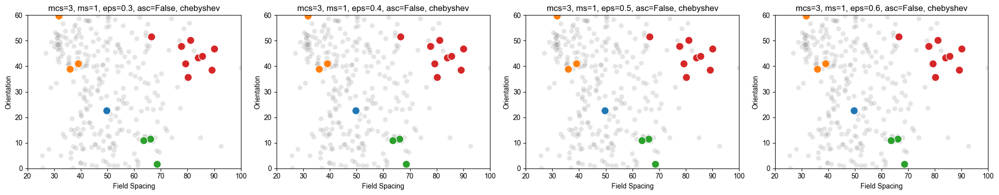

Processing m21d19 with 7 grid cells


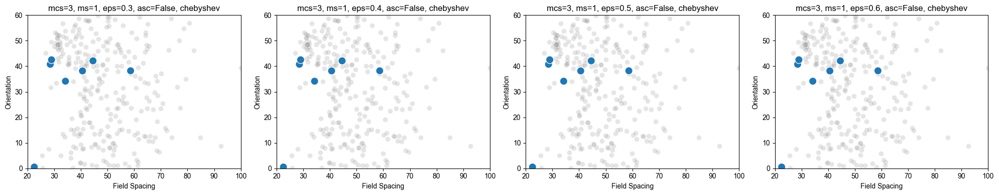

Processing m21d20 with 7 grid cells


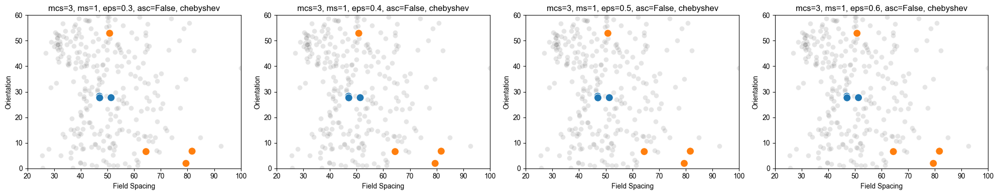

Processing m21d21 with 39 grid cells


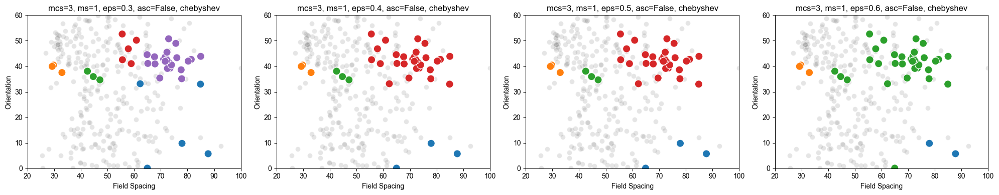

Processing m21d25 with 8 grid cells


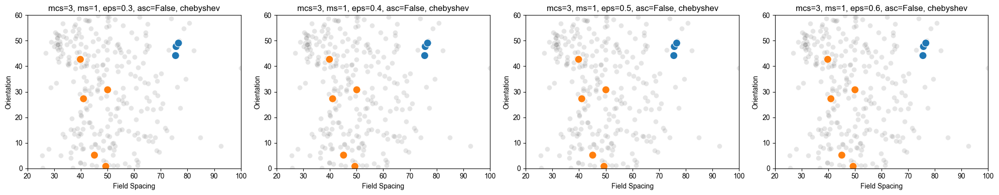

Processing m21d26 with 24 grid cells


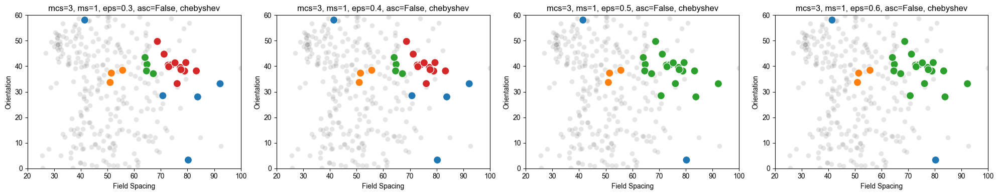

Processing m21d27 with 8 grid cells


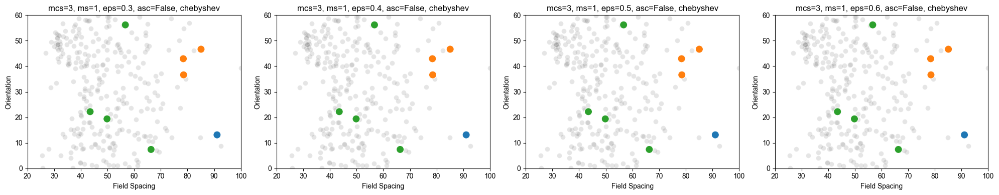

Processing m25d18 with 6 grid cells


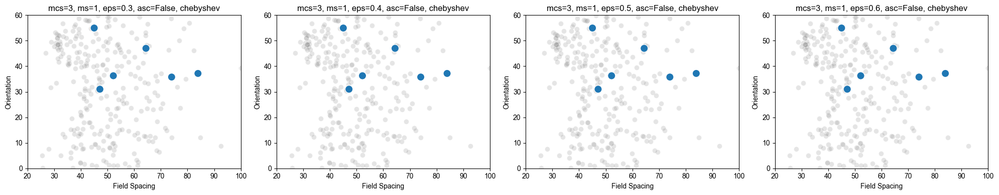

Processing m25d19 with 12 grid cells


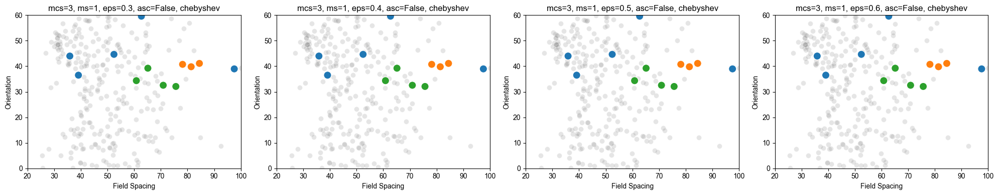

Processing m25d20 with 13 grid cells


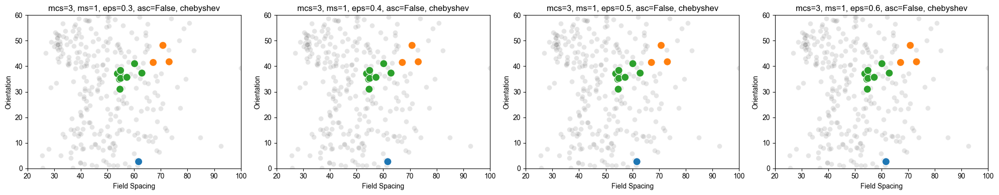

Processing m25d21 with 24 grid cells


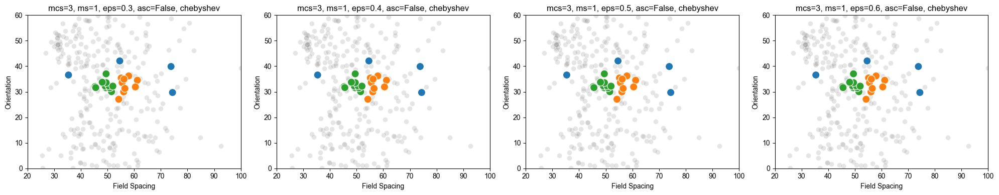

Processing m25d22 with 9 grid cells


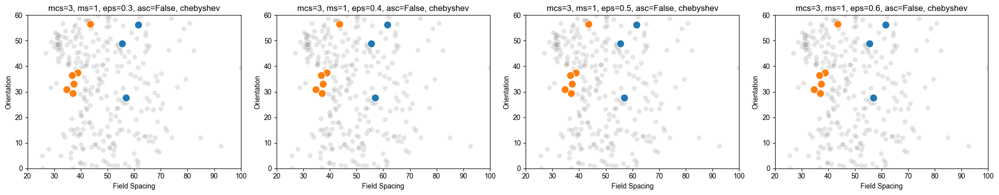

Processing m25d24 with 23 grid cells


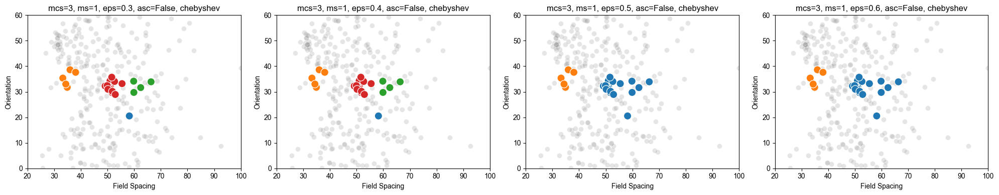

Processing m25d25 with 39 grid cells


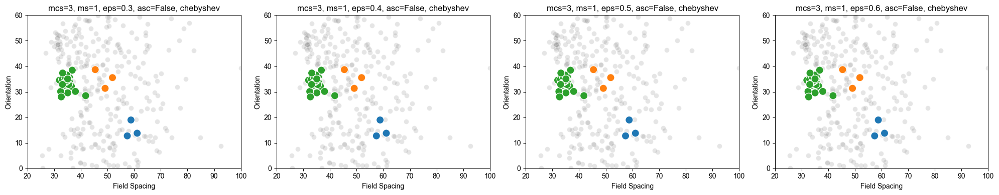

Processing m26d12 with 6 grid cells


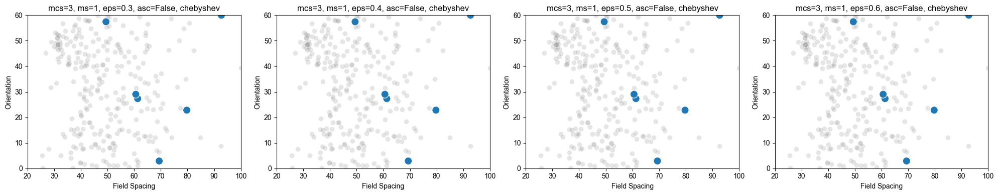

Processing m26d15 with 8 grid cells


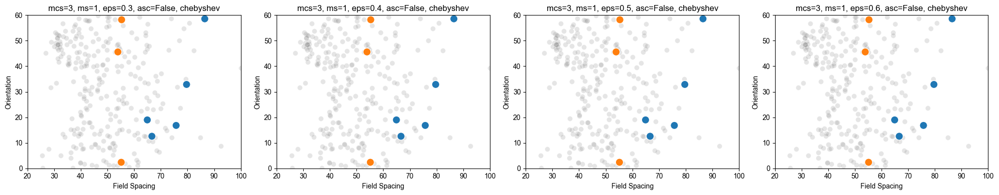

Processing m26d18 with 11 grid cells


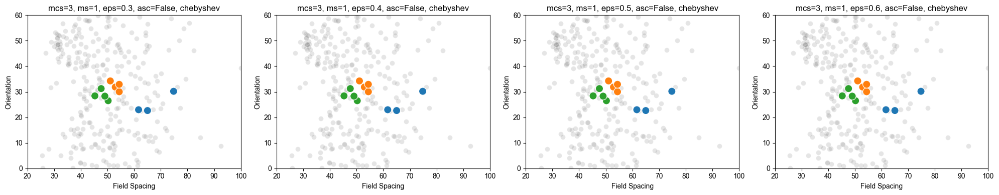

Processing m26d19 with 32 grid cells


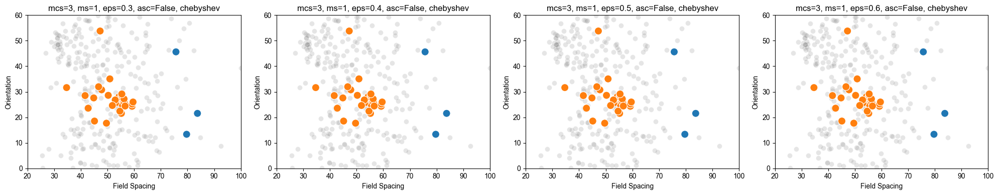

Processing m27d20 with 7 grid cells


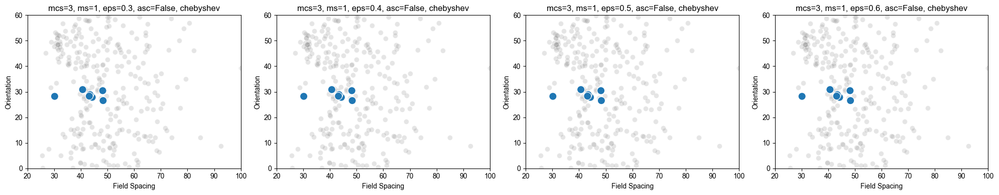

Processing m27d23 with 13 grid cells


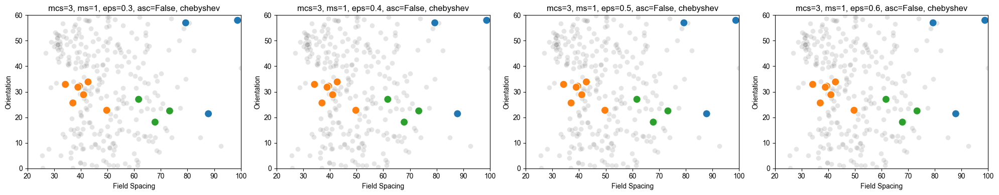

Processing m27d24 with 6 grid cells


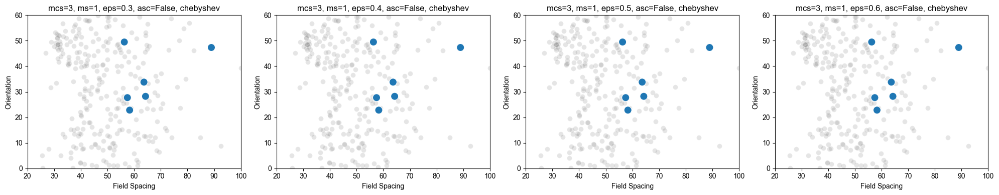

Processing m27d26 with 12 grid cells


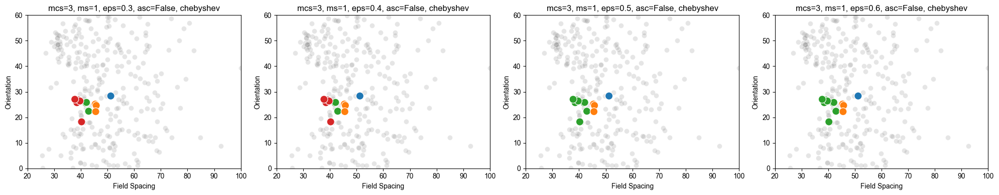

Processing m28d19 with 18 grid cells


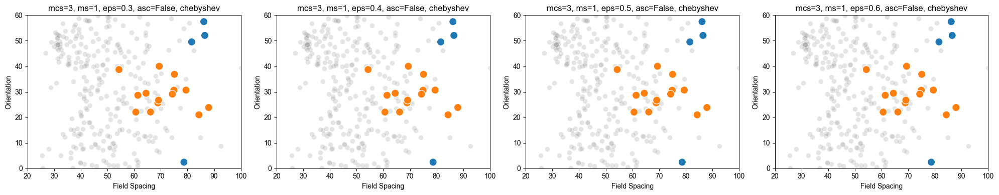

Processing m28d23 with 7 grid cells


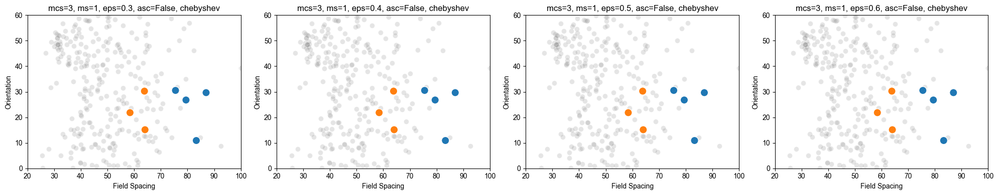

Processing m28d25 with 24 grid cells


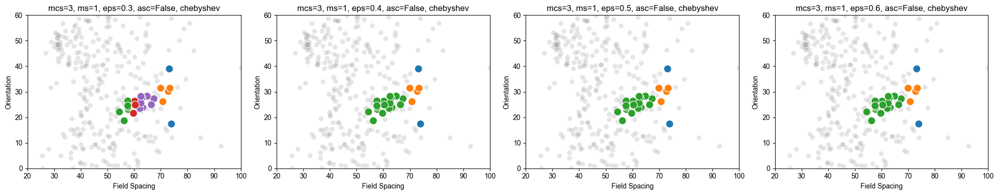

Processing m29d19 with 11 grid cells


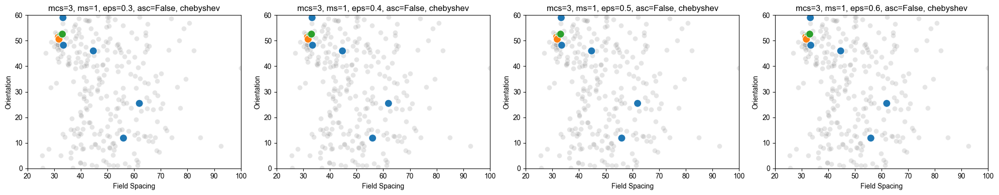

Processing m29d20 with 12 grid cells


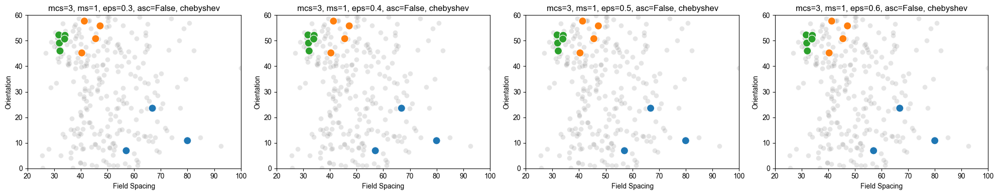

Processing m29d23 with 24 grid cells


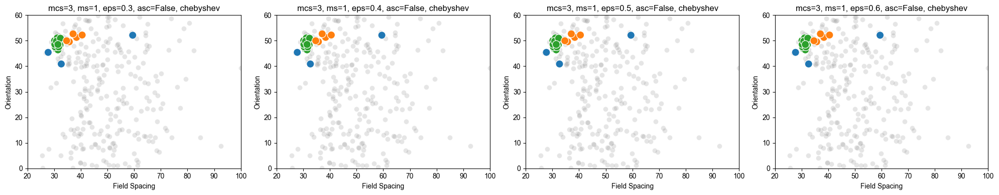

Processing m29d25 with 14 grid cells


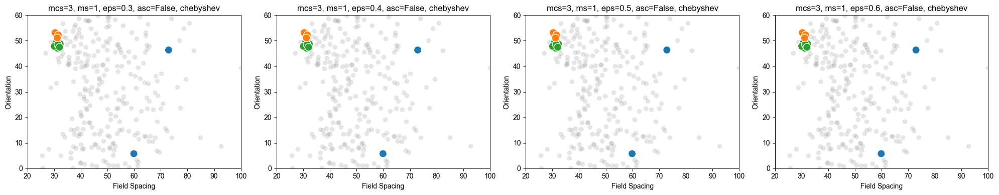

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import hdbscan

for key, (df, all_df) in dict_t.items():
    print(f'Processing {key} with {len(df)} grid cells')
    # Ensure 'field_spacing' and 'orientation' are numeric
    df['field_spacing'] = pd.to_numeric(df['field_spacing'], errors='coerce')
    df['orientation'] = pd.to_numeric(df['orientation'], errors='coerce')
    df.dropna(subset=['field_spacing', 'orientation'], inplace=True)

    # Extract and preprocess features
    X = df[["cluster_id", "field_spacing", "orientation"]].copy()

    # Standard scale the 'field_spacing'
    scaler = StandardScaler()
    X["field_spacing_scaled"] = scaler.fit_transform(X[["field_spacing"]])

    # Cyclic encoding for 'orientation' (range 0 to 60)
    X["orientation_sin"] = np.sin(2 * np.pi * X["orientation"] / 60)
    X["orientation_cos"] = np.cos(2 * np.pi * X["orientation"] / 60)

    # Scale sine and cosine components to balance feature influence
    scale_factor = 1 / np.sqrt(2)
    X["orientation_sin_scaled"] = X["orientation_sin"] * scale_factor
    X["orientation_cos_scaled"] = X["orientation_cos"] * scale_factor

    # Prepare the feature matrix
    features = X[["field_spacing_scaled", "orientation_sin_scaled", "orientation_cos_scaled"]]
    original_features = X[["field_spacing", "orientation"]]
    
    # Define extended parameter grid
    min_cluster_sizes = [3]
    min_samples_list = [1]
    epsilons = [0.3, 0.4, 0.5, 0.6]
    allow_single_cluster_options = [False]
    metrics = ['chebyshev']

    # Store parameter combinations
    param_grid = []
    for mcs in min_cluster_sizes:
        for ms in min_samples_list:
            for eps in epsilons:
                for asc in allow_single_cluster_options:
                    for metric in metrics:
                        param_grid.append((mcs, ms, eps, asc, metric))

    # Display limit for subplots
    n_plots = len(param_grid)
    n_cols = 4
    n_rows = int(np.ceil(n_plots / n_cols))

    # Plot clustering results
    plt.figure(figsize=(5 * n_cols, 4 * n_rows))
    for idx, (mcs, ms, eps, asc, metric) in enumerate(param_grid, 1):
        try:
            clusterer = hdbscan.HDBSCAN(
                min_cluster_size=mcs,
                min_samples=ms,
                cluster_selection_epsilon=eps,
                allow_single_cluster=asc,
                metric=metric
            )
            labels = clusterer.fit_predict(features)
            
            X["cluster"] = labels

            plt.subplot(n_rows, n_cols, idx)
            sns.scatterplot(data=X_all, x="field_spacing", y="orientation", color='grey', s=50, alpha=0.2, legend=False)
            sns.scatterplot(data=X, x="field_spacing", y="orientation", hue="cluster", palette="tab10", s=120, legend=False)
            plt.title(f"mcs={mcs}, ms={ms}, eps={eps}, asc={asc}, {metric}")
            plt.xlim(20, 100)
            plt.ylim(0, 60)
            plt.xlabel("Field Spacing")
            plt.ylabel("Orientation")
        except Exception as e:
            print(f"Failed for params: mcs={mcs}, ms={ms}, eps={eps}, asc={asc}, metric={metric} with error: {e}")

    plt.tight_layout()
    plt.show()


In [22]:
centroids

array([[66.41102609, 26.05637262],
       [31.04848957, 51.89715016],
       [31.30287842, 48.22298183]])

In [23]:
merged_labels

array([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

In [24]:
labels

array([ 1,  0,  1,  0,  1,  1,  1,  1,  1,  0,  1,  0, -1, -1])

Processing m20d25 with 11 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 24.799117286521856
Not merging labels 0 and 1 with distance 24.799117286521856
Not merging labels 0 and 1 with distance 24.799117286521856
Not merging labels 0 and 1 with distance 24.799117286521856


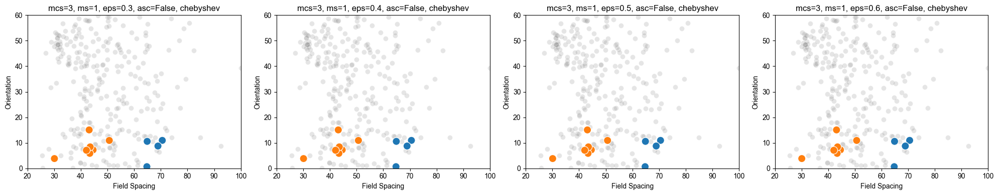

No manual merging of labels


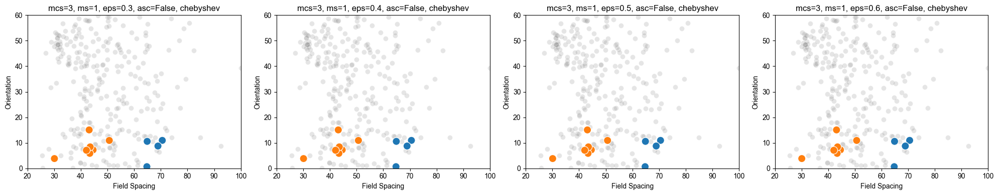

Processing m21d16 with 17 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 49.147997596677136
Not merging labels 0 and 2 with distance 45.63231692326799
Not merging labels 1 and 2 with distance 39.61864589610463
Not merging labels 0 and 1 with distance 49.147997596677136
Not merging labels 0 and 2 with distance 45.63231692326799
Not merging labels 1 and 2 with distance 39.61864589610463
Not merging labels 0 and 1 with distance 49.147997596677136
Not merging labels 0 and 2 with distance 45.63231692326799
Not merging labels 1 and 2 with distance 39.61864589610463
Not merging labels 0 and 1 with distance 49.147997596677136
Not merging labels 0 and 2 with distance 45.63231692326799
Not merging labels 1 and 2 with distance 39.61864589610463


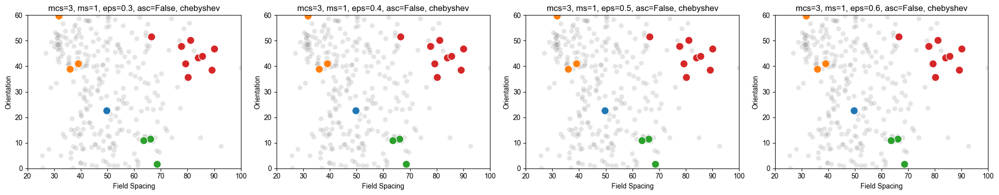

No manual merging of labels


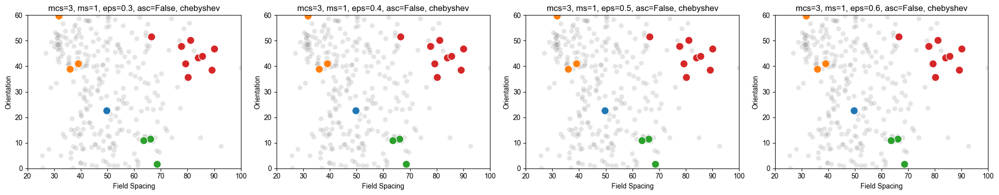

Processing m21d19 with 7 grid cells
Merging labels based on distance between centroids


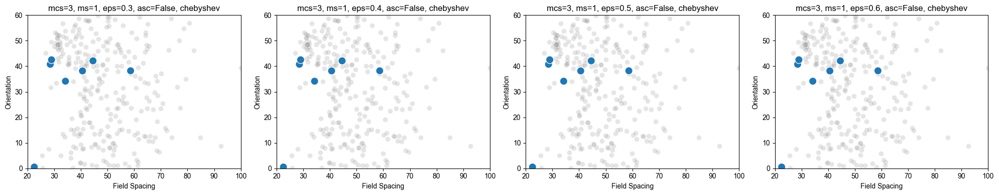

No manual merging of labels


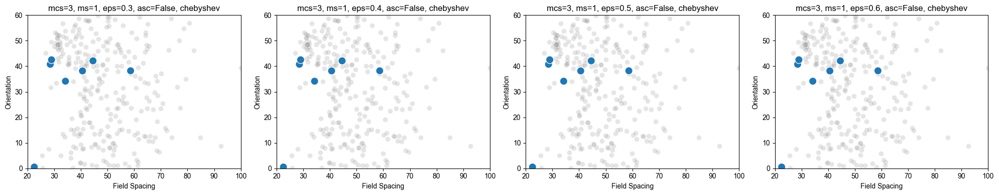

Processing m21d20 with 7 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 23.301218833478337
Not merging labels 0 and 1 with distance 23.301218833478337
Not merging labels 0 and 1 with distance 23.301218833478337
Not merging labels 0 and 1 with distance 23.301218833478337


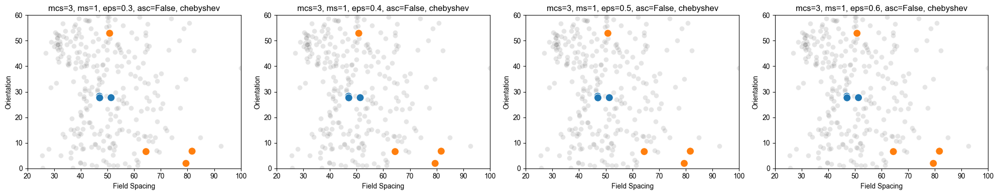

No manual merging of labels


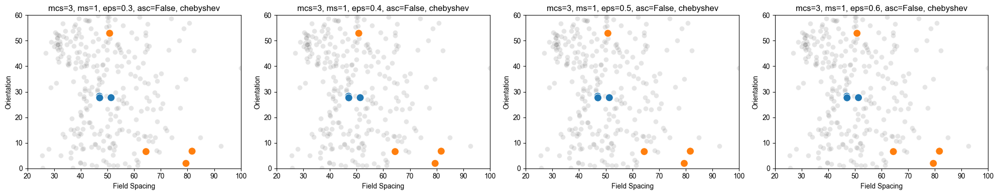

Processing m21d21 with 39 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 14.463189695359064
Not merging labels 0 and 2 with distance 28.07903066851298
Not merging labels 0 and 3 with distance 42.8201977211154
Not merging labels 1 and 2 with distance 16.632629031060016
Not merging labels 1 and 3 with distance 29.184869985229234
Not merging labels 2 and 3 with distance 16.29106781956806
Not merging labels 0 and 1 with distance 14.463189695359064
Not merging labels 0 and 2 with distance 40.24643892881771
Not merging labels 1 and 2 with distance 26.687759183091142
Not merging labels 0 and 1 with distance 14.463189695359064
Not merging labels 0 and 2 with distance 40.24643892881771
Not merging labels 1 and 2 with distance 26.687759183091142
Not merging labels 0 and 1 with distance 37.69234714643423


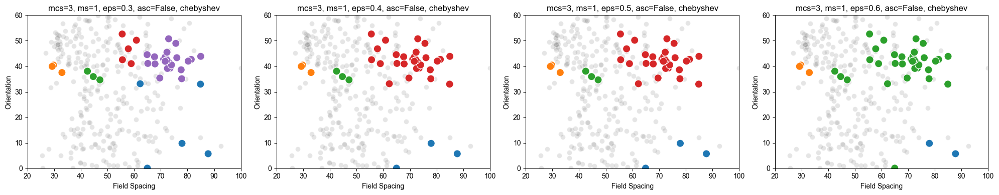

No manual merging of labels


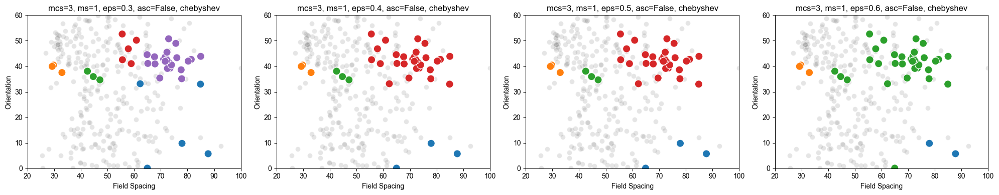

Processing m21d25 with 8 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 40.15184874238774
Not merging labels 0 and 1 with distance 40.15184874238774
Not merging labels 0 and 1 with distance 40.15184874238774
Not merging labels 0 and 1 with distance 40.15184874238774


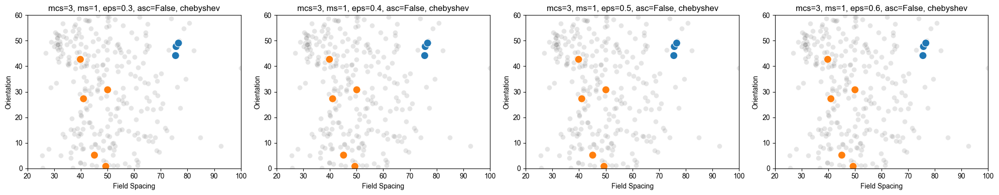

No manual merging of labels


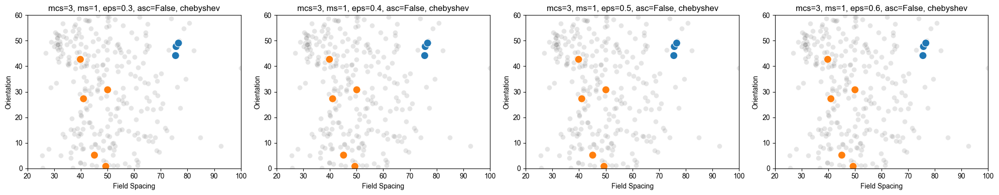

Processing m21d26 with 24 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 12.930976914826656
Not merging labels 0 and 2 with distance 23.27718272401412
Not merging labels 1 and 2 with distance 10.469534808862202
Not merging labels 0 and 1 with distance 12.930976914826656
Not merging labels 0 and 2 with distance 23.27718272401412
Not merging labels 1 and 2 with distance 10.469534808862202
Not merging labels 0 and 1 with distance 21.88931937570328
Not merging labels 0 and 1 with distance 21.88931937570328


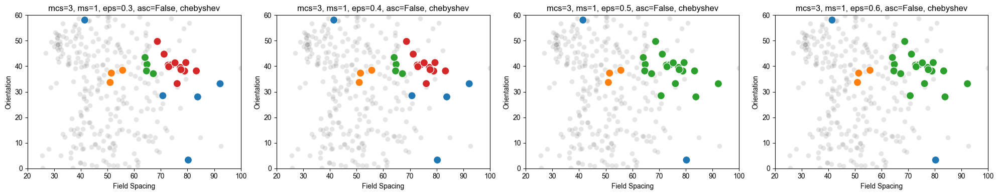

No manual merging of labels


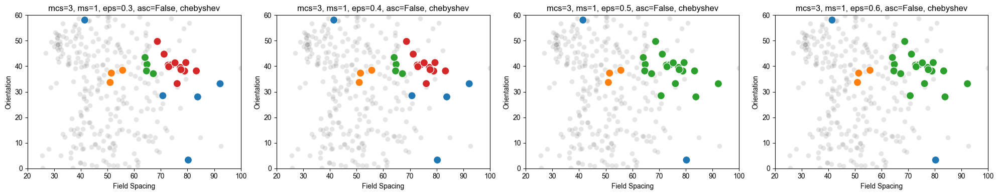

Processing m21d27 with 8 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 30.928122009756486
Not merging labels 0 and 1 with distance 30.928122009756486
Not merging labels 0 and 1 with distance 30.928122009756486
Not merging labels 0 and 1 with distance 30.928122009756486


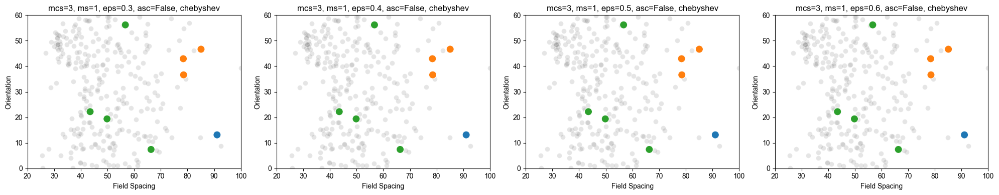

No manual merging of labels


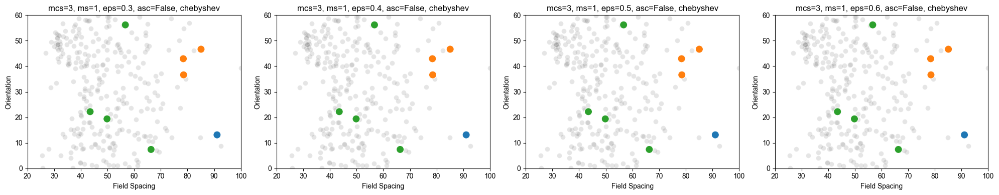

Processing m25d18 with 6 grid cells
Merging labels based on distance between centroids


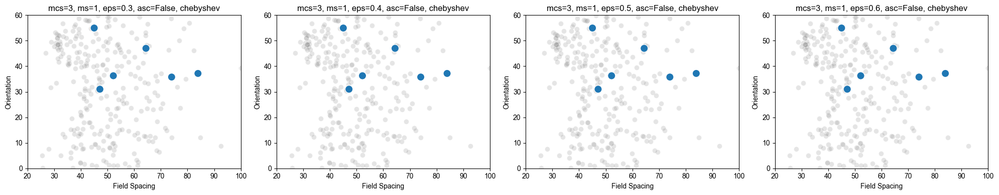

No manual merging of labels


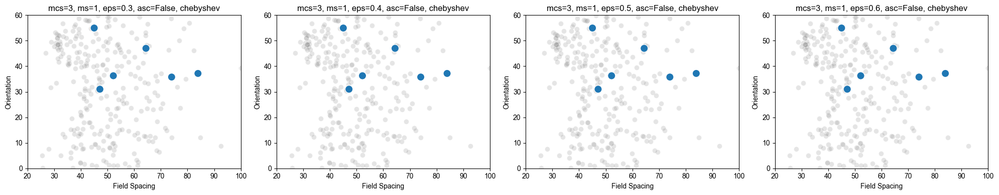

Processing m25d19 with 12 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 14.506768751034713
Not merging labels 0 and 1 with distance 14.506768751034713
Not merging labels 0 and 1 with distance 14.506768751034713
Not merging labels 0 and 1 with distance 14.506768751034713


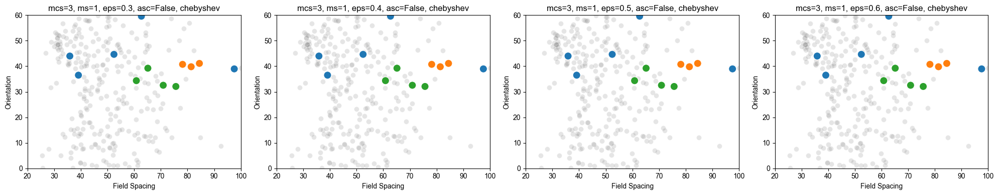

No manual merging of labels


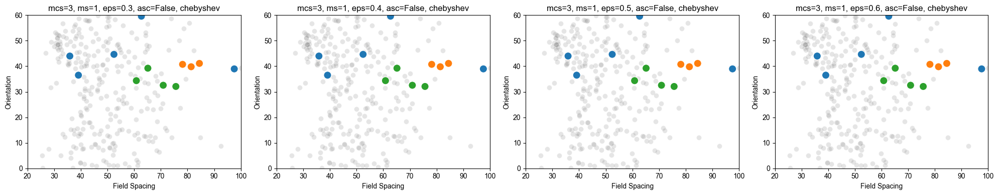

Processing m25d20 with 13 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 15.741818751577284
Not merging labels 0 and 1 with distance 15.741818751577284
Not merging labels 0 and 1 with distance 15.741818751577284
Not merging labels 0 and 1 with distance 15.741818751577284


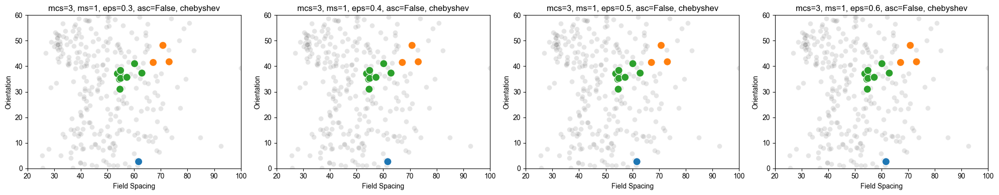

No manual merging of labels


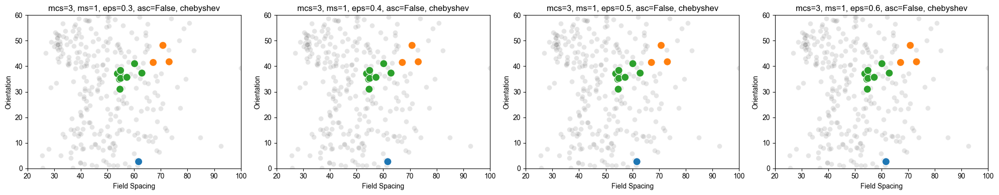

Processing m25d21 with 24 grid cells
Merging labels based on distance between centroids
Merging labels 0 and 1 with distance 7.810719086275887
Merging labels 0 and 1 with distance 7.810719086275887
Merging labels 0 and 1 with distance 7.810719086275887
Merging labels 0 and 1 with distance 7.810719086275887


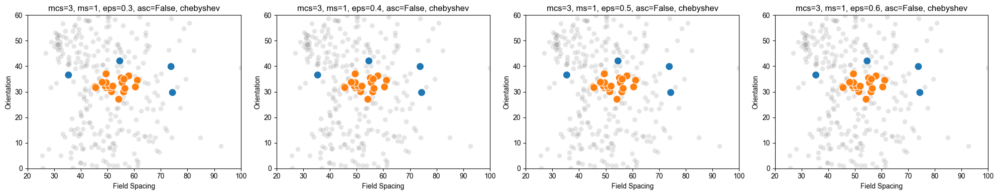

No manual merging of labels


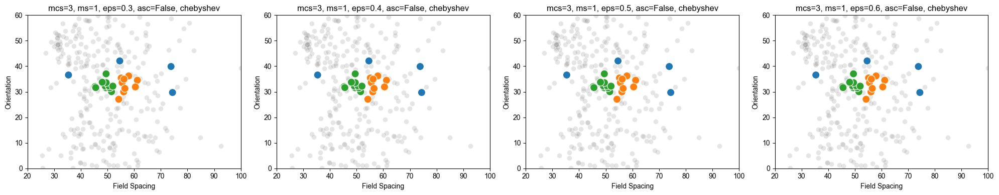

Processing m25d22 with 9 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 21.150334950064664
Not merging labels 0 and 1 with distance 21.150334950064664
Not merging labels 0 and 1 with distance 21.150334950064664
Not merging labels 0 and 1 with distance 21.150334950064664


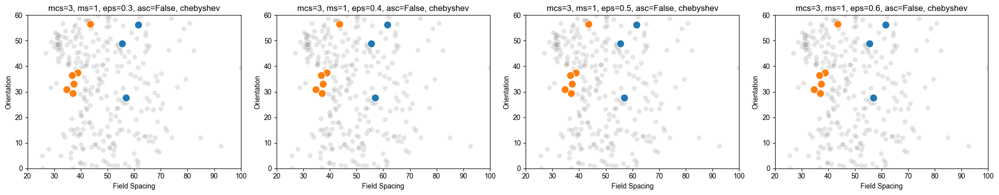

No manual merging of labels


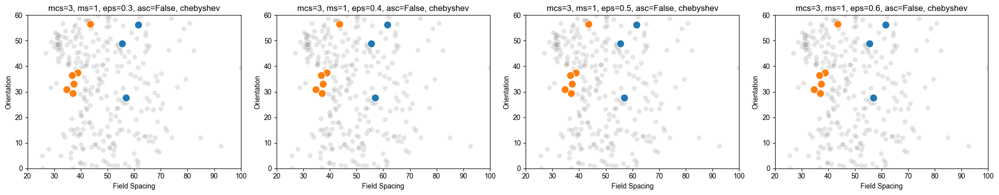

Processing m25d24 with 23 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 26.979441530612775
Not merging labels 0 and 2 with distance 16.455743681011175
Not merging labels 1 and 2 with distance 10.686836455593717
Not merging labels 0 and 1 with distance 26.979441530612775
Not merging labels 0 and 2 with distance 16.455743681011175
Not merging labels 1 and 2 with distance 10.686836455593717
Not merging labels 0 and 1 with distance 19.263734778070198
Not merging labels 0 and 1 with distance 19.263734778070198


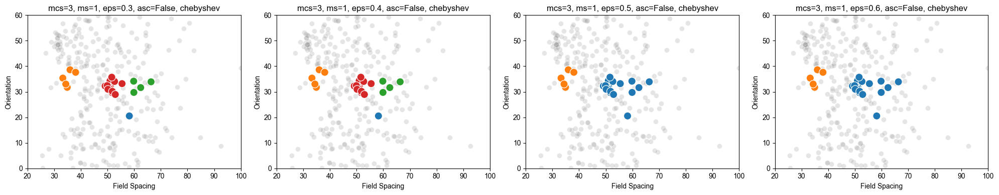

No manual merging of labels


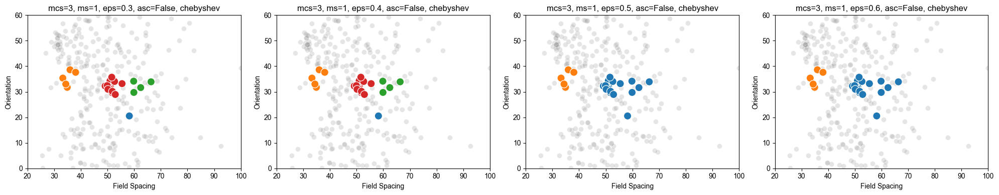

Processing m25d25 with 39 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 22.544489655564348
Not merging labels 0 and 2 with distance 30.627480574951228
Not merging labels 1 and 2 with distance 14.22226483822343
Not merging labels 0 and 1 with distance 22.544489655564348
Not merging labels 0 and 2 with distance 30.627480574951228
Not merging labels 1 and 2 with distance 14.22226483822343
Not merging labels 0 and 1 with distance 22.544489655564348
Not merging labels 0 and 2 with distance 30.627480574951228
Not merging labels 1 and 2 with distance 14.22226483822343
Not merging labels 0 and 1 with distance 22.544489655564348
Not merging labels 0 and 2 with distance 30.627480574951228
Not merging labels 1 and 2 with distance 14.22226483822343


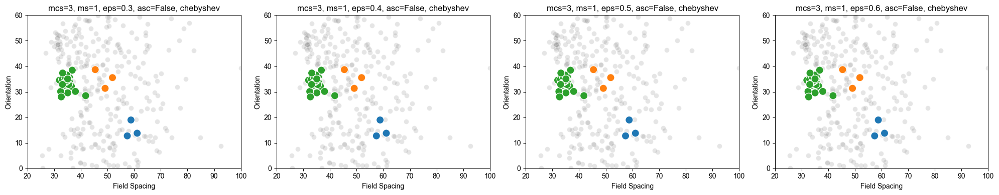

No manual merging of labels


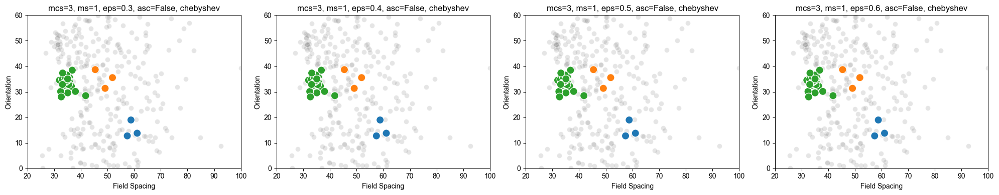

Processing m26d12 with 6 grid cells
Merging labels based on distance between centroids


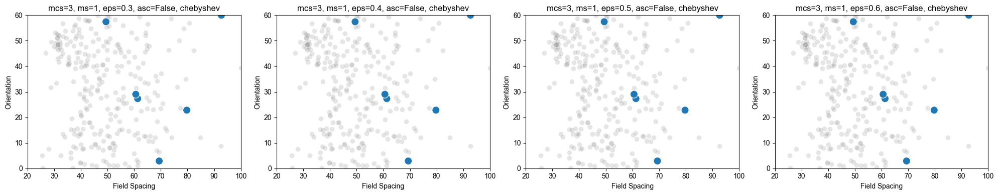

No manual merging of labels


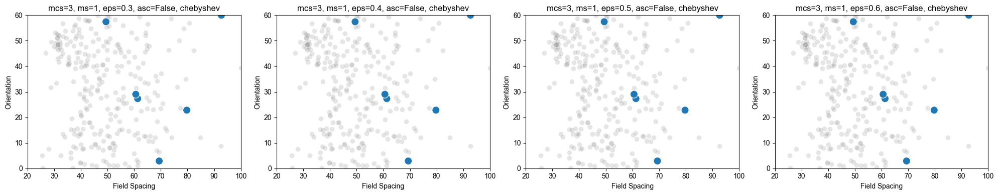

Processing m26d15 with 8 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 21.255557307872653
Not merging labels 0 and 1 with distance 21.255557307872653
Not merging labels 0 and 1 with distance 21.255557307872653
Not merging labels 0 and 1 with distance 21.255557307872653


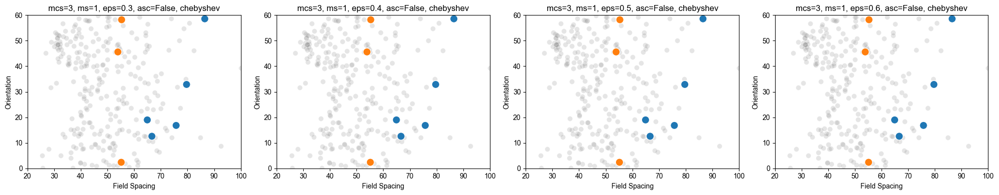

No manual merging of labels


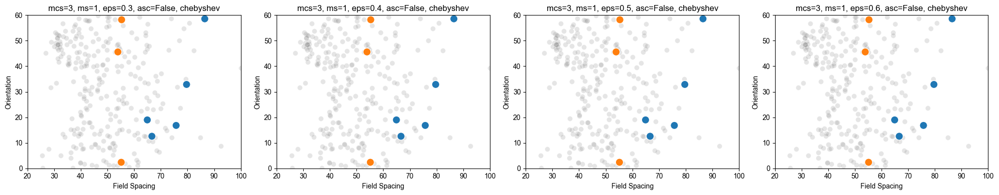

Processing m26d18 with 11 grid cells
Merging labels based on distance between centroids
Merging labels 0 and 1 with distance 6.3163377436667885
Merging labels 0 and 1 with distance 6.3163377436667885
Merging labels 0 and 1 with distance 6.3163377436667885
Merging labels 0 and 1 with distance 6.3163377436667885


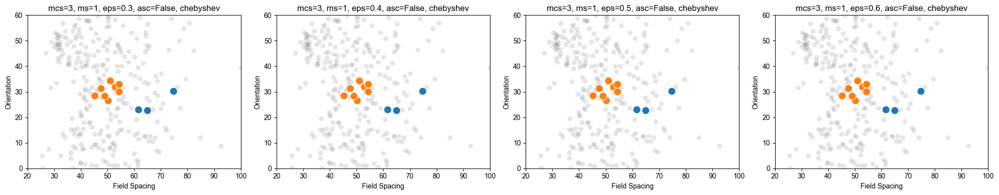

No manual merging of labels


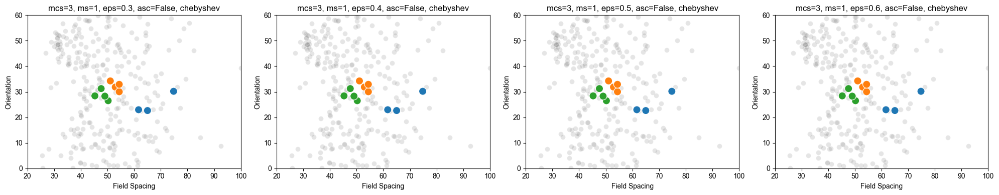

Processing m26d19 with 32 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 28.057189411064744
Not merging labels 0 and 1 with distance 28.057189411064744
Not merging labels 0 and 1 with distance 28.057189411064744
Not merging labels 0 and 1 with distance 28.057189411064744


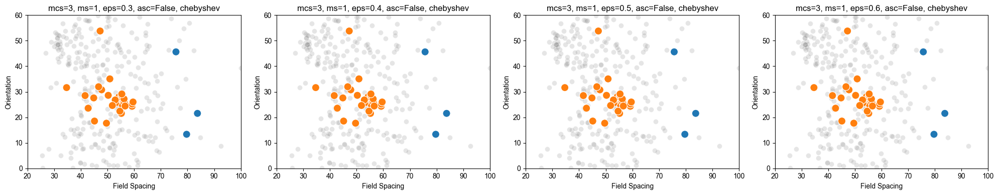

No manual merging of labels


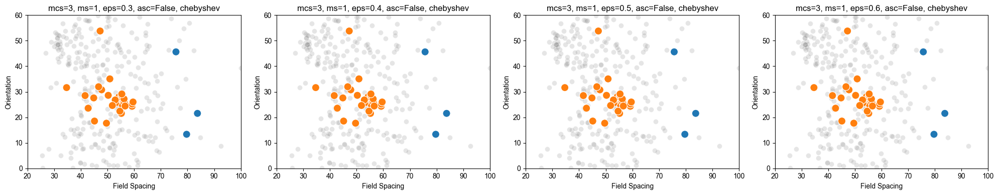

Processing m27d20 with 7 grid cells
Merging labels based on distance between centroids


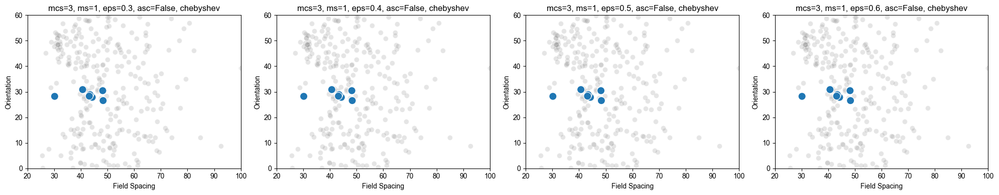

No manual merging of labels


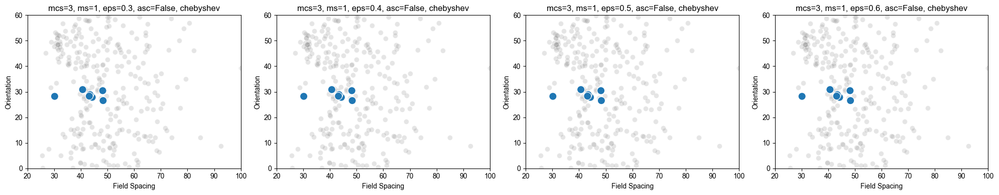

Processing m27d23 with 13 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 28.10209207052715
Not merging labels 0 and 1 with distance 28.10209207052715
Not merging labels 0 and 1 with distance 28.10209207052715
Not merging labels 0 and 1 with distance 28.10209207052715


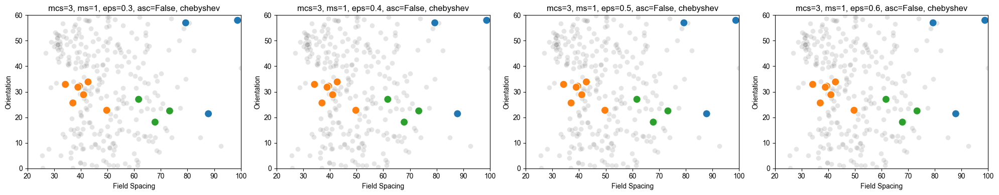

No manual merging of labels


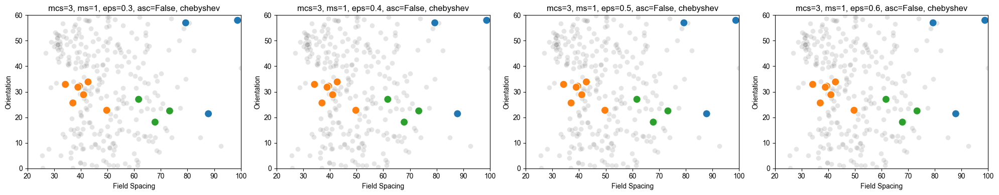

Processing m27d24 with 6 grid cells
Merging labels based on distance between centroids


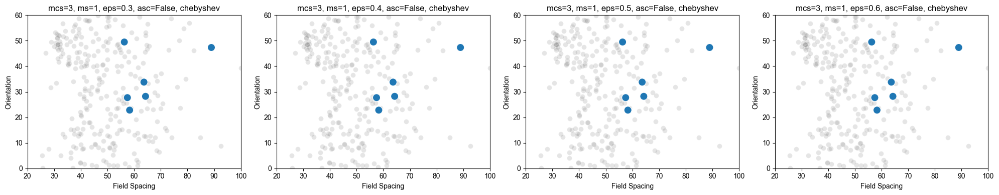

No manual merging of labels


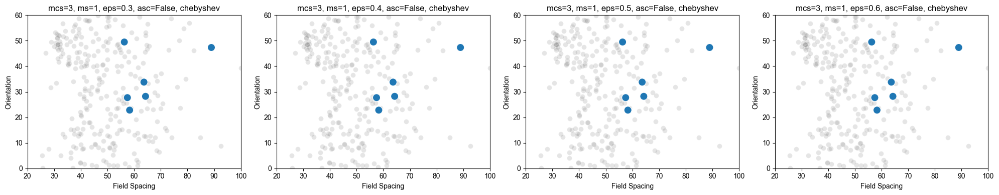

Processing m27d26 with 12 grid cells
Merging labels based on distance between centroids
Merging labels 0 and 1 with distance 3.3380266777636933
Merging labels 0 and 2 with distance 6.572598214624529
Merging labels 1 and 2 with distance 3.2424951431076967
Merging labels 0 and 1 with distance 3.3380266777636933
Merging labels 0 and 2 with distance 6.572598214624529
Merging labels 1 and 2 with distance 3.2424951431076967
Merging labels 0 and 1 with distance 5.35851162983709
Merging labels 0 and 1 with distance 5.35851162983709


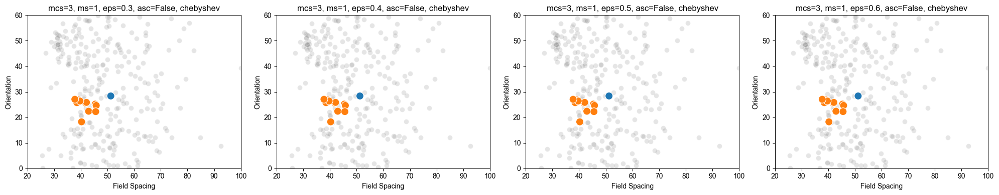

No manual merging of labels


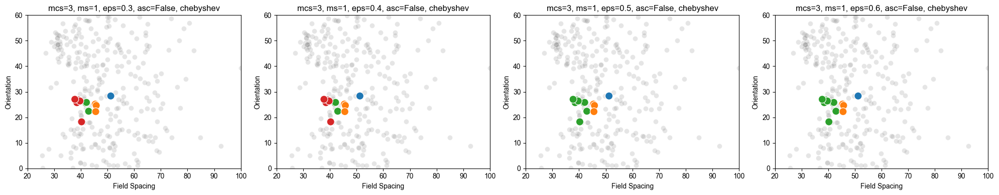

Processing m28d19 with 18 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 16.918558750560678
Not merging labels 0 and 1 with distance 16.918558750560678
Not merging labels 0 and 1 with distance 16.918558750560678
Not merging labels 0 and 1 with distance 16.918558750560678


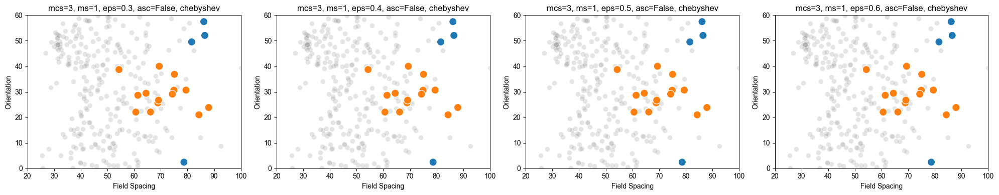

No manual merging of labels


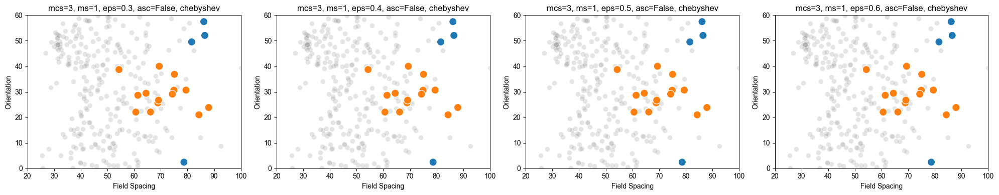

Processing m28d23 with 7 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 19.296199239480284
Not merging labels 0 and 1 with distance 19.296199239480284
Not merging labels 0 and 1 with distance 19.296199239480284
Not merging labels 0 and 1 with distance 19.296199239480284


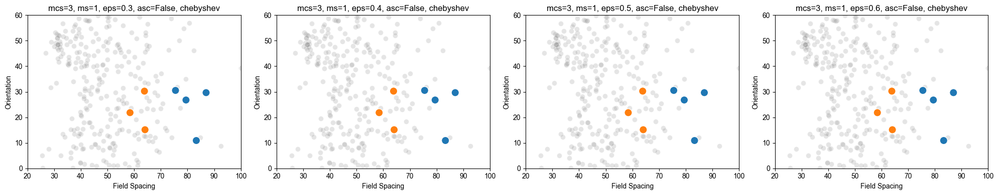

No manual merging of labels


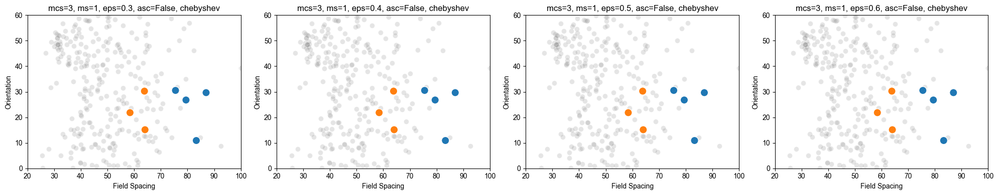

Processing m28d25 with 24 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 16.2597195235653
Not merging labels 0 and 2 with distance 12.8655719829077
Merging labels 0 and 3 with distance 8.723655574269273
Merging labels 1 and 2 with distance 3.410497157339619
Merging labels 1 and 3 with distance 7.543819981637903
Merging labels 2 and 3 with distance 4.142349560525705
Not merging labels 0 and 1 with distance 11.92490731394178
Not merging labels 0 and 1 with distance 11.92490731394178
Not merging labels 0 and 1 with distance 11.92490731394178


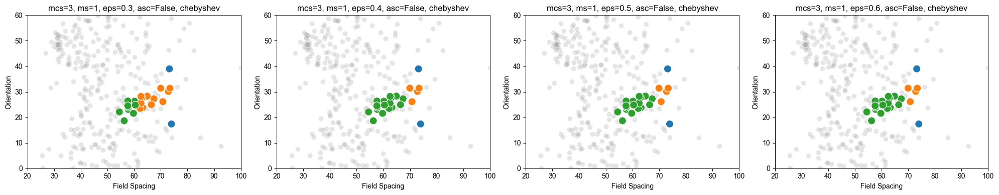

No manual merging of labels


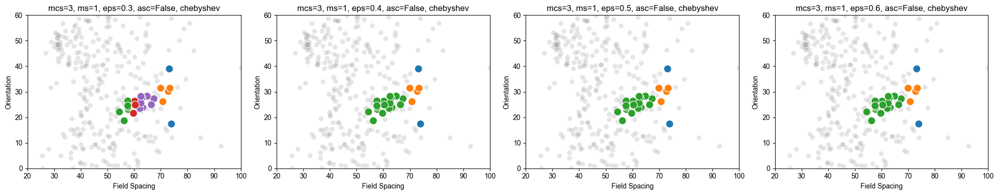

Processing m29d19 with 11 grid cells
Merging labels based on distance between centroids
Merging labels 0 and 1 with distance 1.8106178550302843
Merging labels 0 and 1 with distance 1.8106178550302843
Merging labels 0 and 1 with distance 1.8106178550302843
Merging labels 0 and 1 with distance 1.8106178550302843


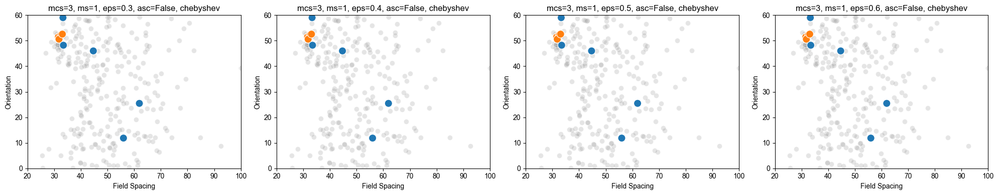

No manual merging of labels


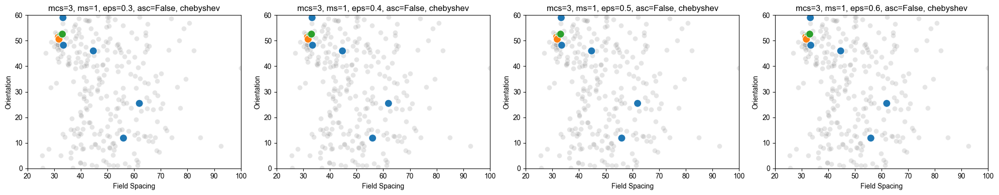

Processing m29d20 with 12 grid cells
Merging labels based on distance between centroids
Not merging labels 0 and 1 with distance 11.092632894751768
Not merging labels 0 and 1 with distance 11.092632894751768
Not merging labels 0 and 1 with distance 11.092632894751768
Not merging labels 0 and 1 with distance 11.092632894751768


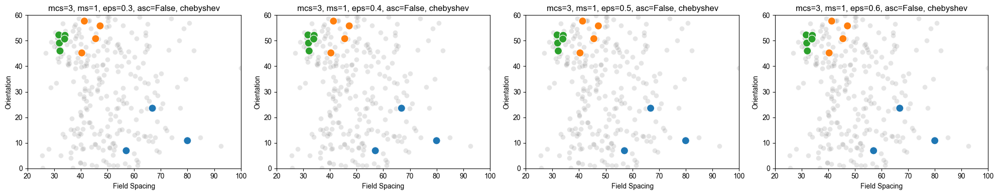

No manual merging of labels


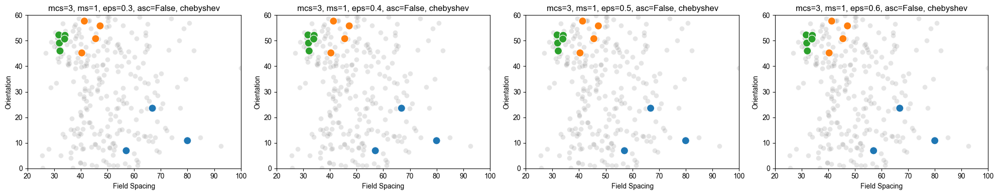

Processing m29d23 with 24 grid cells
Merging labels based on distance between centroids
Merging labels 0 and 1 with distance 6.480460847707891
Merging labels 0 and 1 with distance 6.480460847707891
Merging labels 0 and 1 with distance 6.480460847707891
Merging labels 0 and 1 with distance 6.480460847707891


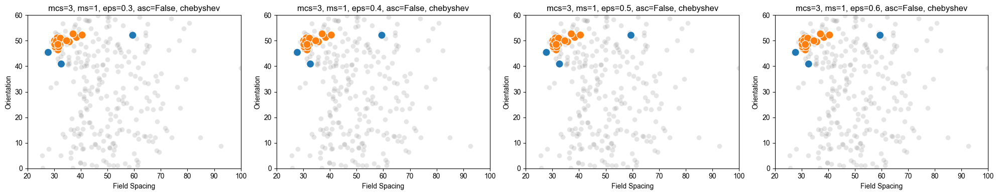

No manual merging of labels


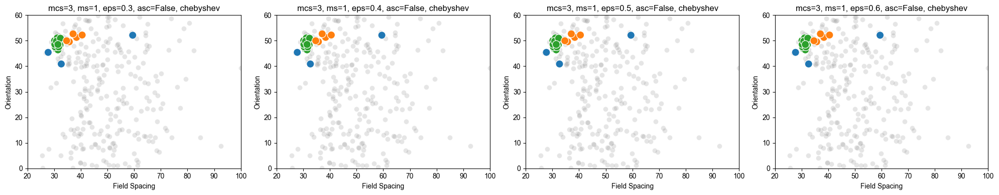

Processing m29d25 with 14 grid cells
Merging labels based on distance between centroids
Merging labels 0 and 1 with distance 3.6829643822366522
Merging labels 0 and 1 with distance 3.6829643822366522
Merging labels 0 and 1 with distance 3.6829643822366522
Merging labels 0 and 1 with distance 3.6829643822366522


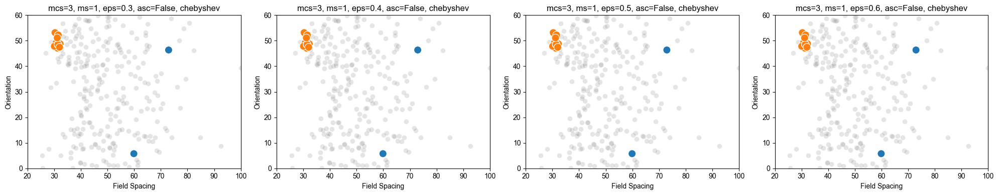

No manual merging of labels


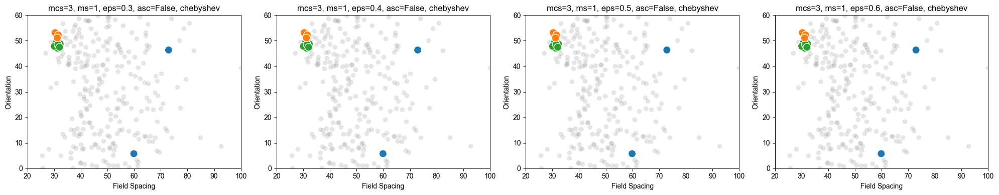

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import hdbscan

for key, (df, all_df) in dict_t.items():
    print(f'Processing {key} with {len(df)} grid cells')
    # Ensure 'field_spacing' and 'orientation' are numeric
    df['field_spacing'] = pd.to_numeric(df['field_spacing'], errors='coerce')
    df['orientation'] = pd.to_numeric(df['orientation'], errors='coerce')
    df.dropna(subset=['field_spacing', 'orientation'], inplace=True)

    # Extract and preprocess features
    X = df[["cluster_id", "field_spacing", "orientation"]].copy()

    # Standard scale the 'field_spacing'
    scaler = StandardScaler()
    X["field_spacing_scaled"] = scaler.fit_transform(X[["field_spacing"]])

    # Cyclic encoding for 'orientation' (range 0 to 60)
    X["orientation_sin"] = np.sin(2 * np.pi * X["orientation"] / 60)
    X["orientation_cos"] = np.cos(2 * np.pi * X["orientation"] / 60)

    # Scale sine and cosine components to balance feature influence
    scale_factor = 1 / np.sqrt(2)
    X["orientation_sin_scaled"] = X["orientation_sin"] * scale_factor
    X["orientation_cos_scaled"] = X["orientation_cos"] * scale_factor

    # Prepare the feature matrix
    features = X[["field_spacing_scaled", "orientation_sin_scaled", "orientation_cos_scaled"]]
    original_features = X[["field_spacing", "orientation"]]
    
    # Define extended parameter grid
    min_cluster_sizes = [3]
    min_samples_list = [1]
    epsilons = [0.3, 0.4, 0.5, 0.6]
    allow_single_cluster_options = [False]
    metrics = ['chebyshev']

    # Store parameter combinations
    param_grid = []
    for mcs in min_cluster_sizes:
        for ms in min_samples_list:
            for eps in epsilons:
                for asc in allow_single_cluster_options:
                    for metric in metrics:
                        param_grid.append((mcs, ms, eps, asc, metric))

    # Display limit for subplots
    n_plots = len(param_grid)
    n_cols = 4
    n_rows = int(np.ceil(n_plots / n_cols))

    # Plot clustering results
    for do_manual_merge in [True, False]:
        if do_manual_merge:
            print("Merging labels based on distance between centroids")
        else:
            print("No manual merging of labels")
        plt.figure(figsize=(5 * n_cols, 4 * n_rows))
        for idx, (mcs, ms, eps, asc, metric) in enumerate(param_grid, 1):
            try:
                clusterer = hdbscan.HDBSCAN(
                    min_cluster_size=mcs,
                    min_samples=ms,
                    cluster_selection_epsilon=eps,
                    allow_single_cluster=asc,
                    metric=metric
                )
                labels = clusterer.fit_predict(features)
                
                if do_manual_merge:
                    # merge labels if centroids are within 10 units (e.g., cm or degrees)
                    centroids = original_features.groupby(labels).mean().values
                    centroids = np.array(centroids)
                    # Start with original labels
                    merged_labels = labels.copy()
                    for i, label_i in enumerate(np.unique(labels)):
                        for j, label_j in enumerate(np.unique(labels)):
                            if j <= i or label_i == -1 or label_j == -1:
                                continue
                            if (distance.euclidean(centroids[i], centroids[j]) < 10):
                                print(f"Merging labels {label_i} and {label_j} with distance {distance.euclidean(centroids[i], centroids[j])}")
                                merged_labels[merged_labels == label_j] = label_i
                            else:
                                print(f"Not merging labels {label_i} and {label_j} with distance {distance.euclidean(centroids[i], centroids[j])}")
                    labels = merged_labels.copy()

                X["cluster"] = labels

                plt.subplot(n_rows, n_cols, idx)
                sns.scatterplot(data=X_all, x="field_spacing", y="orientation", color='grey', s=50, alpha=0.2, legend=False)
                sns.scatterplot(data=X, x="field_spacing", y="orientation", hue="cluster", palette="tab10", s=120, legend=False)
                plt.title(f"mcs={mcs}, ms={ms}, eps={eps}, asc={asc}, {metric}")
                plt.xlim(20, 100)
                plt.ylim(0, 60)
                plt.xlabel("Field Spacing")
                plt.ylabel("Orientation")
            
            except Exception as e:
                print(f"Failed for params: mcs={mcs}, ms={ms}, eps={eps}, asc={asc}, metric={metric} with error: {e}")
        plt.tight_layout()
        plt.show()


test it in the function that we'll use for all of the analysis

27 26
there are 22 non_grid and non_spatial_cells
there are 12 grid_cells
there are 20 non grid spatial cells
there are 2 non spatial cells
there are 1 speed cells
there are 35 cells
None
Merging labels 0 and 1 with distance 3.3380266777636933
Merging labels 0 and 2 with distance 6.572598214624529
Merging labels 1 and 2 with distance 3.2424951431076967
Found 2 modules with HDBSCAN for mouse 27 day 26
for each module , the number of points is: [ 1 11]


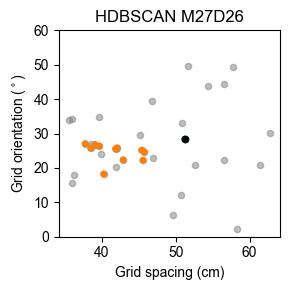

for module 0, there are 11 cells with average spacing 41.72919672948084
module 0 contains cells from ['PAR' 'VISpl5' 'VISpl6a']


In [35]:
mouse=27; day=26
gcs, ngs, ns, sc, ngs_ns, all = cell_classification_of1(mouse, day, percentile_threshold=95) # subset
_,_ = HDBSCAN_grid_modules(gcs, all, mouse=mouse, day=day, figpath='', curate_with_vr=True, curate_with_brain_region=True)